<a href="https://colab.research.google.com/github/ManoloVM21/MachineLearningTeam4/blob/main/MachineLearningTeam4/Module%204%20-%20Neutral%20Networks/Manolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [114]:
%pip install tensorflow
%pip install lets-plot

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 29.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 332.3/332.3 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 kB 4.3 MB/s eta 0:00:00


# Exploration

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from lets_plot import *
#
#%%
#Model testing first
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.metrics import root_mean_squared_error, r2_score
import numpy as np
bikes = pd.read_csv("https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/bikes.csv")
bikes.tail()


ModuleNotFoundError: No module named 'lets_plot'

## It is important to be aware of every kind of events (including political) because in those days were the maximum amount of uses of bikes

In [ ]:
bikes.describe()

,hr,casual,registered,temp_c,feels_like_c,hum,windspeed,weathersit,season,holiday,workingday
count,112475.000000,112475.000000,112475.000000,112475.000000,112475.000000,112475.000000,112475.000000,112475.000000,112475.000000,112475.000000,112475.000000
mean,11.501098,90.434612,249.193625,15.376487,14.659325,0.636624,13.100614,1.405441,2.495799,0.030300,0.684312
std,6.921864,128.655621,258.267544,9.749467,11.428324,0.190328,7.857600,0.683450,1.101152,0.171412,0.464791
min,0.000000,0.000000,0.000000,-14.700000,-24.000000,0.088900,0.000000,1.000000,1.000000,0.000000,0.000000
25%,6.000000,7.000000,48.000000,7.600000,5.400000,0.484100,7.700000,1.000000,2.000000,0.000000,0.000000
50%,12.000000,36.000000,180.000000,16.000000,16.000000,0.640900,12.200000,1.000000,2.000000,0.000000,1.000000
75%,18.000000,122.000000,360.000000,23.500000,23.500000,0.798800,17.500000,2.000000,3.000000,0.000000,1.000000
max,23.000000,1244.000000,1702.000000,40.500000,49.600000,1.000000,69.800000,4.000000,4.000000,1.000000,1.000000


In [ ]:
bikes[bikes['casual']>1000]

,dteday,hr,casual,registered,temp_c,feels_like_c,hum,windspeed,weathersit,season,holiday,workingday
54606,3/25/2017,13.0,1034,582,20.8,20.8,0.5386,16.2,2,2,0,0
54608,3/25/2017,15.0,1030,595,25.0,25.0,0.4324,9.2,1,2,0,0
55112,4/15/2017,15.0,1037,558,22.9,22.9,0.5674,12.8,1,2,0,0
63847,4/14/2018,15.0,1050,746,28.8,28.2,0.3711,30.0,1,2,0,0
82661,6/6/2020,15.0,1005,409,31.6,34.2,0.5215,16.3,1,2,0,0
82662,6/6/2020,16.0,1244,501,32.0,34.2,0.4895,20.7,1,2,0,0
82663,6/6/2020,17.0,1061,416,32.1,33.5,0.4559,26.7,1,2,0,0
86357,11/7/2020,15.0,1008,550,22.9,22.9,0.3632,10.9,1,4,0,0
89715,3/27/2021,14.0,1008,457,20.8,20.8,0.4441,14.3,1,2,0,0
100854,7/4/2022,18.0,1029,418,30.5,29.6,0.3409,14.3,1,3,1,0


In [ ]:
bikes[(bikes['registered']>1500) | (bikes['casual'] > 1500)].groupby(['day','month','year']).agg(total_casual = ('casual','sum'), total_registered = ('registered','sum'))

KeyError: 'day'

In [ ]:
bikes[(bikes['casual'] > 1500) | bikes(['registered'] > 1500)]

TypeError: '>' not supported between instances of 'list' and 'int'

In [ ]:
bikes["datetime"] = pd.to_datetime(bikes["dteday"])
bikes["month"] = bikes["datetime"].dt.month
bikes['day'] = bikes['datetime'].dt.month
bikes["day_of_week"] = bikes["datetime"].dt.dayofweek
bikes["year"] = bikes["datetime"].dt.year
bikes = bikes.drop(columns = ['dteday'])
bikes['total'] = bikes['casual'] + bikes['registered']

In [ ]:
bikes[(bikes['year'] == 2018) & (bikes['season'] == 3)].head(20)

,hr,casual,registered,temp_c,feels_like_c,hum,windspeed,weathersit,season,holiday,workingday,month,day,day_of_week,year,total
65464,0.0,13,36,23.3,23.3,0.8523,0.0,2,3,0,1,6,6,3,2018,49
65465,1.0,7,23,23.3,23.3,0.8531,11.3,2,3,0,1,6,6,3,2018,30
65466,2.0,2,9,22.8,22.8,0.8774,9.5,2,3,0,1,6,6,3,2018,11
65467,3.0,0,5,22.8,22.8,0.8780,5.4,2,3,0,1,6,6,3,2018,5
65468,4.0,2,21,22.8,22.8,0.8790,0.0,1,3,0,1,6,6,3,2018,23
65469,5.0,8,106,22.7,22.7,0.8798,7.5,1,3,0,1,6,6,3,2018,114
65470,6.0,17,395,22.8,22.8,0.8801,7.5,1,3,0,1,6,6,3,2018,412
65471,7.0,40,881,23.3,23.3,0.8800,5.4,1,3,0,1,6,6,3,2018,921
65472,8.0,95,1241,24.3,24.3,0.8268,7.2,1,3,0,1,6,6,3,2018,1336
65473,9.0,88,571,26.1,26.1,0.7442,7.5,1,3,0,1,6,6,3,2018,659


## What is the peak hour?
between 6am and 8am, and between 4pm and 6pm. However in weekends the peak is not as high but people rides between 8am and 8pm.

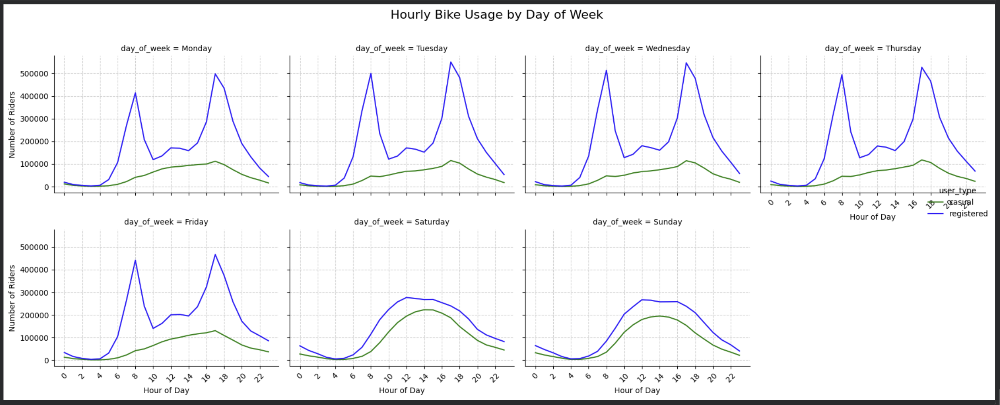

## What % of total daily rents this windows happens?

Aprox 69% of the daily rents happens in the windows of 6-10am and 2-8pm.

On weekdays,
The morning window represents 23%
The afternoon window represents 46%

On weekends,
The total rents is distributed more consistently throughout the day. No peak hours detected. just consistence between 6am and 8pm with more density on 12pm and 3pm




In [ ]:
import pandas as pd
import numpy as np

# Define peak hour windows
# 6-8 AM (hours 6, 7)
peak_morning_start = 6
peak_morning_end = 10 # Exclusive, so includes hour 7

# 2-8 PM (hours 14, 15, 16, 17, 18, 19)
peak_afternoon_start = 14
peak_afternoon_end = 20 # Exclusive, so includes hour 19

# Calculate total daily rentals
daily_rentals = bikes.groupby(['year', 'month', 'day', 'day_of_week'])['total'].sum().reset_index()
daily_rentals = daily_rentals.rename(columns={'total': 'daily_total_rentals'})

# Calculate rentals during peak morning hours
peak_morning_rentals = bikes[
    (bikes['hr'] >= peak_morning_start) & (bikes['hr'] < peak_morning_end)
].groupby(['year', 'month', 'day', 'day_of_week'])['total'].sum().reset_index()
peak_morning_rentals = peak_morning_rentals.rename(columns={'total': 'peak_morning_rentals'})

# Calculate rentals during peak afternoon hours
peak_afternoon_rentals = bikes[
    (bikes['hr'] >= peak_afternoon_start) & (bikes['hr'] < peak_afternoon_end)
].groupby(['year', 'month', 'day', 'day_of_week'])['total'].sum().reset_index()
peak_afternoon_rentals = peak_afternoon_rentals.rename(columns={'total': 'peak_afternoon_rentals'})

# Merge all dataframes
merged_rentals = pd.merge(daily_rentals, peak_morning_rentals, on=['year', 'month', 'day', 'day_of_week'], how='left')
merged_rentals = pd.merge(merged_rentals, peak_afternoon_rentals, on=['year', 'month', 'day', 'day_of_week'], how='left')

# Fill NaN values (days without rentals in a specific peak window) with 0
merged_rentals['peak_morning_rentals'] = merged_rentals['peak_morning_rentals'].fillna(0)
merged_rentals['peak_afternoon_rentals'] = merged_rentals['peak_afternoon_rentals'].fillna(0)

# Calculate total peak hour rentals
merged_rentals['total_peak_rentals'] = merged_rentals['peak_morning_rentals'] + merged_rentals['peak_afternoon_rentals']

# Calculate percentage of total daily rentals during peak hours
# Handle potential division by zero if daily_total_rentals is 0
merged_rentals['peak_percentage'] = (
    merged_rentals['total_peak_rentals'] / merged_rentals['daily_total_rentals']
) * 100
merged_rentals['peak_percentage'] = merged_rentals['peak_percentage'].replace([np.inf, -np.inf], 0).fillna(0)


# Calculate the average peak percentage by day of the week
peak_hour_percentages = merged_rentals.groupby('day_of_week')['peak_percentage'].mean().reset_index()

# Map day_of_week to names for better readability
day_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
peak_hour_percentages['day_of_week_name'] = peak_hour_percentages['day_of_week'].map(day_names)

print("Average percentage of daily total bike rentals during peak hours (6-8 AM and 2-8 PM) by day of the week:")
display(peak_hour_percentages)

Average percentage of daily total bike rentals during peak hours (6-8 AM and 2-8 PM) by day of the week:


,day_of_week,peak_percentage,day_of_week_name
0,0,69.003372,Monday
1,1,70.681812,Tuesday
2,2,70.072425,Wednesday
3,3,69.145699,Thursday
4,4,66.649259,Friday
5,5,53.598131,Saturday
6,6,53.498964,Sunday


In [ ]:
((merged_rentals[merged_rentals['day_of_week']<5]['peak_morning_rentals'] / merged_rentals[merged_rentals['day_of_week']<5]['daily_total_rentals'])*100).mean()

np.float64(23.237825497153576)

In [ ]:
((merged_rentals[merged_rentals['day_of_week']<5]['peak_afternoon_rentals'] / merged_rentals[merged_rentals['day_of_week']<5]['daily_total_rentals'])*100).mean()

np.float64(45.872687802227084)

In [ ]:
merged_rentals[merged_rentals['day_of_week']<5]['peak_percentage'].mean()

np.float64(69.11051329938066)

In [ ]:
((merged_rentals[merged_rentals['day_of_week']>=5]['peak_morning_rentals'] / merged_rentals[merged_rentals['day_of_week']>=5]['daily_total_rentals'])*100).mean()

np.float64(8.457490553213448)

In [ ]:
((merged_rentals[merged_rentals['day_of_week']>=5]['peak_afternoon_rentals'] / merged_rentals[merged_rentals['day_of_week']>=5]['daily_total_rentals'])*100).mean()

np.float64(45.09105719128584)

In [ ]:
merged_rentals[merged_rentals['day_of_week']>=5]['peak_percentage'].mean()

np.float64(53.548547744499295)

In [ ]:
from lets_plot import *

plot_peak_percentage = (
    ggplot(peak_hour_percentages, aes(x='day_of_week_name', y='peak_percentage', fill='day_of_week_name'))
    + geom_bar(stat='identity')
    + labs(
        title='Average Percentage of Daily Rentals during Peak Hours by Day of the Week',
        x='Day of the Week',
        y='Average Peak Percentage (%)',
        fill='Day of the Week'
    )
    + theme(axis_text_x=element_text(angle=45, hjust=1))
)

display(plot_peak_percentage)

In [ ]:
import pandas as pd
import numpy as np
from lets_plot import *

# Ensure 'total' column exists (if not already created)
if 'total' not in bikes.columns:
    bikes['total'] = bikes['casual'] + bikes['registered']

# Create a unique day identifier for grouping
bikes['day_identifier'] = bikes['year'].astype(str) + '-' + bikes['month'].astype(str).str.zfill(2) + '-' + bikes['day'].astype(str).str.zfill(2)

# Calculate total daily rentals
daily_totals = bikes.groupby('day_identifier')['total'].sum().reset_index()
daily_totals.rename(columns={'total': 'daily_total_rentals'}, inplace=True)

# Calculate hourly rentals for casual, registered, and total
hourly_rentals_detailed = bikes.groupby(['day_identifier', 'day_of_week', 'hr'])[['casual', 'registered', 'total']].sum().reset_index()

# Merge with daily totals
hourly_proportions_detailed = pd.merge(hourly_rentals_detailed, daily_totals, on='day_identifier', how='left')

# Calculate the proportion of hourly casual and registered rentals relative to the daily total
hourly_proportions_detailed['casual_proportion'] = hourly_proportions_detailed.apply(
    lambda row: row['casual'] / row['daily_total_rentals'] if row['daily_total_rentals'] > 0 else 0,
    axis=1
)
hourly_proportions_detailed['registered_proportion'] = hourly_proportions_detailed.apply(
    lambda row: row['registered'] / row['daily_total_rentals'] if row['daily_total_rentals'] > 0 else 0,
    axis=1
)

# Melt the detailed proportions for plotting
df_melted_proportions = hourly_proportions_detailed.melt(
    id_vars=['day_identifier', 'day_of_week', 'hr'],
    value_vars=['casual_proportion', 'registered_proportion'],
    var_name='rider_type',
    value_name='proportion'
)

# Calculate the average hourly proportion for each day of the week and rider type
average_hourly_proportions_detailed = df_melted_proportions.groupby(['day_of_week', 'hr', 'rider_type'])['proportion'].mean().reset_index()

# Map day_of_week to names for better readability and ensure correct order
day_names_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_names_map = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
average_hourly_proportions_detailed['day_of_week_name'] = average_hourly_proportions_detailed['day_of_week'].map(day_names_map)
average_hourly_proportions_detailed['day_of_week_name'] = pd.Categorical(average_hourly_proportions_detailed['day_of_week_name'], categories=day_names_order, ordered=True)

# Display the first few rows of the result
print("Average hourly proportions of bike rentals by day of the week and rider type:")
display(average_hourly_proportions_detailed.head())

# Create the bar grid plot
plot_hourly_proportions_detailed = (
    ggplot(average_hourly_proportions_detailed, aes(x='hr', y='proportion', color='rider_type'))
    + geom_line(size=1)
    + facet_grid(x='day_of_week_name', scales='free_x') # Create a subplot for each day of the week
    + labs(
        title='Hourly Proportion of Bike Rentals by Day of the Week and Rider Type',
        x='Hour of Day',
        y='Average Proportion of Daily Rentals',
        color='Rider Type'
    )
    + scale_x_continuous(breaks=list(range(0, 24, 4))) # Set x-axis breaks for hours
    + ggsize(1000, 300)
)

display(plot_hourly_proportions_detailed)

Average hourly proportions of bike rentals by day of the week and rider type:


,day_of_week,hr,rider_type,proportion,day_of_week_name
0,0,0.0,casual_proportion,0.000286,Monday
1,0,0.0,registered_proportion,0.000541,Monday
2,0,1.0,casual_proportion,0.000141,Monday
3,0,1.0,registered_proportion,0.000257,Monday
4,0,2.0,casual_proportion,0.000079,Monday


In [ ]:
# Calculate total daily rentals for each day
bikes['day_identifier'] = bikes['year'].astype(str) + '-' + bikes['month'].astype(str).str.zfill(2) + '-' + bikes['day'].astype(str).str.zfill(2)
daily_totals_df = bikes.groupby('day_identifier')['total'].sum().reset_index()
daily_totals_df.rename(columns={'total': 'daily_total_rentals'}, inplace=True)

# Calculate total casual and registered rentals for each day, and keep the correct day_of_week
daily_rider_totals_df = bikes.groupby('day_identifier').agg({'casual': 'sum', 'registered': 'sum', 'day_of_week': 'first'}).reset_index()

# Merge daily rider totals with daily total rentals
daily_proportions_df = pd.merge(daily_rider_totals_df, daily_totals_df, on='day_identifier')

# Calculate daily proportions
daily_proportions_df['casual_daily_proportion'] = daily_proportions_df.apply(
    lambda row: row['casual'] / row['daily_total_rentals'] if row['daily_total_rentals'] > 0 else 0,
    axis=1
)
daily_proportions_df['registered_daily_proportion'] = daily_proportions_df.apply(
    lambda row: row['registered'] / row['daily_total_rentals'] if row['daily_total_rentals'] > 0 else 0,
    axis=1
)

# Melt for easier averaging and plotting
daily_proportions_melted = daily_proportions_df.melt(
    id_vars=['day_identifier', 'day_of_week'],
    value_vars=['casual_daily_proportion', 'registered_daily_proportion'],
    var_name='rider_type',
    value_name='daily_proportion'
)

# Calculate the average daily proportion for each rider type by day of the week
average_daily_proportions_by_type = daily_proportions_melted.groupby(['day_of_week', 'rider_type'])['daily_proportion'].mean().reset_index()

# Map day_of_week to names for readability
day_names_map = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
average_daily_proportions_by_type['day_of_week_name'] = average_daily_proportions_by_type['day_of_week'].map(day_names_map)
average_daily_proportions_by_type

,day_of_week,rider_type,daily_proportion,day_of_week_name
0,0,casual_daily_proportion,0.252194,Monday
1,0,registered_daily_proportion,0.747806,Monday
2,1,casual_daily_proportion,0.250772,Tuesday
3,1,registered_daily_proportion,0.749228,Tuesday
4,2,casual_daily_proportion,0.251250,Wednesday
5,2,registered_daily_proportion,0.748750,Wednesday
6,3,casual_daily_proportion,0.244980,Thursday
7,3,registered_daily_proportion,0.755020,Thursday
8,4,casual_daily_proportion,0.251220,Friday
9,4,registered_daily_proportion,0.748780,Friday


In [ ]:
average_hourly_proportions_detailed.groupby('rider_type')['proportion'].sum()

,proportion
rider_type,
casual_proportion,0.244698
registered_proportion,0.755302


## Do weekends matter?
Yes. registered people uses to ride on weekdays, and reduces their frequency on weekends.
On the other hand, casual people uses to ride on weekends, mainly on satudays, however sundays still has a big difference in comparison to weekdays.

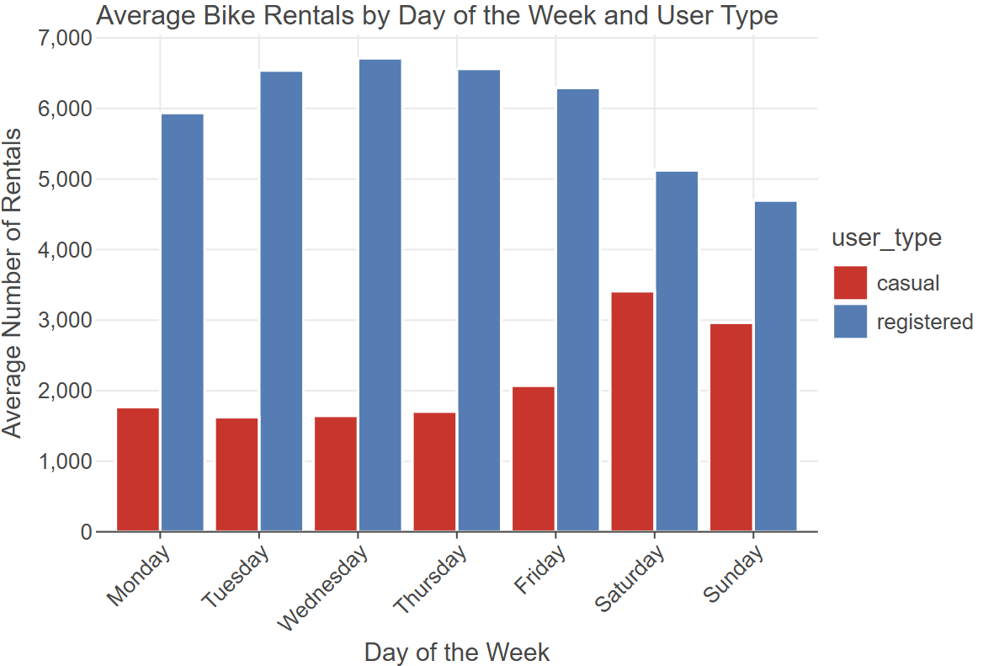

## how does the amount of bikes differ when it is holidays?
 1. The behavior of types of riders does not vary much. Registered Riders are more plausible to rent than casual ones by far, but in holidays casual ones are more often
 2. Is slightly more on weekdends, but are almost the same. Its interesting that in the middle of the week are more outliers than weekends
 3. Yes. Being ways less frequent than weekdays, holidays' distribution and total are very similay to weekdays.

In [ ]:

from lets_plot import *
import pandas as pd


# Calculate proportions
bikes['casual_proportion'] = bikes['casual'] / bikes['total']
bikes['registered_proportion'] = bikes['registered'] / bikes['total']

# Reshape data for plotting
df_proportions = bikes[['holiday', 'casual_proportion', 'registered_proportion']].melt(
    id_vars=['holiday'], var_name='rider_type', value_name='proportion'
)

# Plot proportions
plot_proportions = ggplot(df_proportions, aes(x='holiday', y='proportion', fill='rider_type')) + \
    geom_boxplot() + \
    labs(title='Rider Proportions by Holiday Status',
         x='Holiday (0: No, 1: Yes)',
         y='Proportion of Total Rides',
         fill='Rider Type')

display(plot_proportions)

In [ ]:
ggplot(bikes, aes(x = 'day_of_week', y = 'total')) + geom_boxplot()

In [ ]:
from lets_plot import *
import pandas as pd

bikes['total'] = bikes['casual'] + bikes['registered']

plot_total_by_holiday = ggplot(bikes, aes(x = 'holiday', y = 'total')) + \
    geom_boxplot() + \
    labs(title='Total Bike Rentals by Holiday Status',
         x='Holiday (0: No, 1: Yes)',
         y='Total Rides')

display(plot_total_by_holiday)

## which season is the most demanded for bike rents?
Spring and Summer are more frequent to rent bikes. However, fall has more outliers. Why?? Covid?

In [ ]:
ggplot(bikes, aes('season', 'total')) + geom_boxplot()

## how the weather affect to the bikes rents? is temperature important?
1. The distribution of both, temperature and feels_like are right-skewed. Both shows that people uses more bikes when the temperature or feels_like is close to 26-27°C and decreases when it exceeds this value. -> **It is important to normalize it.**

2. Windspeed needs normalization

3. Registered users don't care much about humitity or temperature as much as casual


In [ ]:
ggplot(bikes, aes('temp_c', 'total')) + geom_point()

In [ ]:
ggplot(bikes, aes('temp_c', 'casual')) + geom_point()

In [ ]:
ggplot(bikes, aes('temp_c', 'registered')) + geom_point()

In [ ]:
ggplot(bikes, aes('feels_like_c', 'total')) + geom_point()

In [ ]:
ggplot(bikes, aes('feels_like_c', 'casual')) + geom_point()

In [ ]:
ggplot(bikes, aes('feels_like_c', 'registered')) + geom_point()

In [ ]:
ggplot(bikes, aes('hum', 'total')) + geom_point()

In [ ]:
ggplot(bikes, aes('windspeed', 'total')) + geom_point()

## What is more important? temp or feels_like?

Feelslike is a mix of hum, windspeed and temp.

Use: TEMP + HUM + WINDSPEED OR FEELSLIKE

## Is there any interaction with the weather situation?
No. The proportion keeps being the same no matter the weathersit. The only thinG that changes is the amount. 1 > 2 > 3 >> 4

In [ ]:
from lets_plot import *
import pandas as pd

# Ensure 'total' column exists
if 'total' not in bikes.columns:
    bikes['total'] = bikes['casual'] + bikes['registered']

# Map day_of_week to names for better readability
day_names_map = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
bikes['day_of_week_name'] = bikes['day_of_week'].map(day_names_map)

# Map weathersit to names for better readability
weathersit_names = {1: 'Clear', 2: 'Cloudy', 3: 'Light Snow/Rain', 4: 'Heavy Snow/Rain'}
bikes['weathersit_name'] = bikes['weathersit'].map(weathersit_names)

# Melt the data to have 'casual' and 'registered' as a single column for plotting
df_melted_riders = bikes.melt(
    id_vars=['day_of_week_name', 'weathersit_name'],
    value_vars=['casual', 'registered'],
    var_name='rider_type',
    value_name='rentals'
)

# Aggregate rentals by day, weathersit, and rider type for plotting
# This ensures we're plotting sums for each category
aggregated_rentals = df_melted_riders.groupby(['day_of_week_name', 'weathersit_name', 'rider_type'])['rentals'].mean().reset_index()

# Ensure day_of_week_name is ordered correctly for plotting
day_names_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
aggregated_rentals['day_of_week_name'] = pd.Categorical(aggregated_rentals['day_of_week_name'], categories=day_names_order, ordered=True)


plot_weathersit_impact = (
    ggplot(aggregated_rentals, aes(x='day_of_week_name', y='rentals', fill='rider_type'))
    + geom_bar(stat='identity', position='dodge') # 'dodge' for side-by-side bars
    + facet_grid(x='weathersit_name', scales='free_x') # Separate plots by weather situation
    + labs(
        title='Bike Rentals by Day of Week, Rider Type, and Weather Situation',
        x='Day of the Week',
        y='Mean Rentals',
        fill='Rider Type'
    )
    + theme(axis_text_x=element_text(angle=45, hjust=1))
    + ggsize(1000, 600)
)

display(plot_weathersit_impact)

## Impact of Covid. Until what time it got back to normality?

between spring 2020 and Fall 2021. Internet says 2nd November. The amount of bike rents increases slightly according to the season until fall 2021, when the rents can be considered that are back in the normality.
I would be better to set exact dates.

In [ ]:
from lets_plot import *
import pandas as pd

# Ensure 'total' column exists
if 'total' not in bikes.columns:
    bikes['total'] = bikes['casual'] + bikes['registered']

# Create 'year_month' column for all data
bikes['year_month'] = bikes['year'].astype(str) + '-' + bikes['month'].astype(str).str.zfill(2)

# Aggregate total rentals by 'year_month'
timeline_data_all = bikes.groupby('year_month')['total'].sum().reset_index()

# Sort by 'year_month' to ensure correct plotting order
timeline_data_all = timeline_data_all.sort_values('year_month')

# Create custom labels for x-axis: '#month last_2_digits_of_year'
timeline_data_all['display_label'] = timeline_data_all['year_month'].apply(lambda x: f"#{x.split('-')[1]} {x.split('-')[0][-2:]}")

# Plotting the timeline for all data
timeline_plot_all = (
    ggplot(timeline_data_all, aes(x='display_label', y='total'))
    + geom_line(color='blue', size=1)
    + labs(
        title='Total Bike Rentals Over Time (All Data)',
        x='Month-Year',
        y='Total Bike Rentals'
    )
    + theme(axis_text_x=element_text(angle=45, hjust=1))
)

display(timeline_plot_all)

In [ ]:
bikes_winter = bikes[bikes['season'] == 1].copy()
bikes_winter['year_month'] = bikes_winter['year'].astype(str) + '-' + bikes_winter['month'].astype(str).str.zfill(2)

timeline_data_winter = bikes_winter.groupby('year_month')['total'].sum().reset_index()
timeline_data_winter = timeline_data_winter.sort_values('year_month')
timeline_data_winter['display_label'] = timeline_data_winter['year_month'].apply(lambda x: f"#{x.split('-')[1]} {x.split('-')[0][-2:]}")

timeline_plot_winter = (
    ggplot(timeline_data_winter, aes(x='display_label', y='total'))
    + geom_line(color='blue', size=1)
    + labs(
        title='Total Bike Rentals Over Time (Winter Season)',
        x='Month-Year',
        y='Total Bike Rentals'
    )
    + theme(axis_text_x=element_text(angle=45, hjust=1))
)

display(timeline_plot_winter)

In [ ]:
bikes_spring = bikes[bikes['season'] == 2].copy()
bikes_spring['year_month'] = bikes_spring['year'].astype(str) + '-' + bikes_spring['month'].astype(str).str.zfill(2)

timeline_data_spring = bikes_spring.groupby('year_month')['total'].sum().reset_index()
timeline_data_spring = timeline_data_spring.sort_values('year_month')
timeline_data_spring['display_label'] = timeline_data_spring['year_month'].apply(lambda x: f"#{x.split('-')[1]} {x.split('-')[0][-2:]}")

timeline_plot_spring = (
    ggplot(timeline_data_spring, aes(x='display_label', y='total'))
    + geom_line(color='orange', size=1)
    + labs(
        title='Total Bike Rentals Over Time (Spring Season)',
        x='Month-Year',
        y='Total Bike Rentals'
    )
    + theme(axis_text_x=element_text(angle=45, hjust=1))
)

display(timeline_plot_spring)

In [ ]:
bikes_summer = bikes[bikes['season'] == 3].copy()
bikes_summer['year_month'] = bikes_summer['year'].astype(str) + '-' + bikes_summer['month'].astype(str).str.zfill(2)

timeline_data_summer = bikes_summer.groupby('year_month')['total'].sum().reset_index()
timeline_data_summer = timeline_data_summer.sort_values('year_month')
timeline_data_summer['display_label'] = timeline_data_summer['year_month'].apply(lambda x: f"#{x.split('-')[1]} {x.split('-')[0][-2:]}")

timeline_plot_summer = (
    ggplot(timeline_data_summer, aes(x='display_label', y='total'))
    + geom_line(color='green', size=1)
    + labs(
        title='Total Bike Rentals Over Time (Summer Season)',
        x='Month-Year',
        y='Total Bike Rentals'
    )
    + theme(axis_text_x=element_text(angle=45, hjust=1))
)

display(timeline_plot_summer)

In [ ]:
bikes_fall = bikes[bikes['season'] == 4].copy()
bikes_fall['year_month'] = bikes_fall['year'].astype(str) + '-' + bikes_fall['month'].astype(str).str.zfill(2)

timeline_data_fall = bikes_fall.groupby('year_month')['total'].sum().reset_index()
timeline_data_fall = timeline_data_fall.sort_values('year_month')
timeline_data_fall['display_label'] = timeline_data_fall['year_month'].apply(lambda x: f"#{x.split('-')[1]} {x.split('-')[0][-2:]}")

timeline_plot_fall = (
    ggplot(timeline_data_fall, aes(x='display_label', y='total'))
    + geom_line(color='red', size=1)
    + labs(
        title='Total Bike Rentals Over Time (Fall Season)',
        x='Month-Year',
        y='Total Bike Rentals'
    )
    + theme(axis_text_x=element_text(angle=45, hjust=1))
)

display(timeline_plot_fall)

In [ ]:
from lets_plot import *
import pandas as pd

# Ensure 'total' column exists
if 'total' not in bikes.columns:
    bikes['total'] = bikes['casual'] + bikes['registered']

# Aggregate total rentals by year and season
yearly_seasonal_data = bikes.groupby(['year', 'season'])['total'].sum().reset_index()

# Map season numbers to names for better readability
season_names = {1: 'Winter', 2: 'Spring', 3: 'Summer', 4: 'Fall'}
yearly_seasonal_data['season_name'] = yearly_seasonal_data['season'].map(season_names)

# Plotting the stacked bar chart
plot_yearly_seasonal = ( # Renamed the plot object
    ggplot(yearly_seasonal_data, aes(x='year', y='total', fill='season_name'))
    + geom_bar(stat='identity', position = 'dodge')
    + labs(
        title='Total Bike Rentals by Year and Season',
        x='Year',
        y='Total Bike Rentals',
        fill='Season'
    )
    + theme(axis_text_x=element_text(angle=45, hjust=1))
)

display(plot_yearly_seasonal)

## When COVID is considered over?

 From March 2020 to October 2021

In [ ]:
baseline_periods = bikes[(bikes['year'] >= 2018) & (bikes['year'] <= 2019)].copy()
baseline_monthly_avg = baseline_periods.groupby(['year', 'month'])['total'].mean().reset_index()
post_covid_periods = bikes[(bikes['year'] >= 2020) & (bikes['year'] <= 2022)].copy()
post_covid_monthly_avg = post_covid_periods.groupby(['year', 'month'])['total'].mean().reset_index()
baseline_monthly_avg_std = baseline_monthly_avg.groupby('month')['total'].agg(['mean', 'std']).reset_index()
baseline_monthly_avg_std.columns = ['month', 'baseline_avg', 'baseline_std']

comparison_df = pd.merge(post_covid_monthly_avg, baseline_monthly_avg_std, on='month', how='left')
comparison_df['lower_bound'] = comparison_df['baseline_avg'] - comparison_df['baseline_std']
comparison_df['upper_bound'] = comparison_df['baseline_avg'] + comparison_df['baseline_std']

def check_normality(row):
    if row['total'] >= row['lower_bound'] and row['total'] <= row['upper_bound']:
        return 'Within Normal Range'
    elif row['total'] < row['lower_bound']:
        return 'Below Normal'
    else:
        return 'Above Normal'

comparison_df['normality_status'] = comparison_df.apply(check_normality, axis=1)
comparison_df['year_month'] = comparison_df['year'].astype(str) + '-' + comparison_df['month'].astype(str).str.zfill(2)


print("Comparison DataFrame with normality status (first 5 rows):")
display(comparison_df.head())

Comparison DataFrame with normality status (first 5 rows):


,year,month,total,baseline_avg,baseline_std,lower_bound,upper_bound,normality_status,year_month
0,2020,1,264.743280,214.630376,16.926844,197.703533,231.557220,Above Normal,2020-01
1,2020,2,255.604885,253.354167,25.514770,227.839397,278.868936,Within Normal Range,2020-02
2,2020,3,218.748318,331.634590,14.097406,317.537183,345.731996,Below Normal,2020-03
3,2020,4,104.820833,470.068750,18.743240,451.325510,488.811990,Below Normal,2020-04
4,2020,5,200.337366,478.372984,34.605464,443.767520,512.978448,Below Normal,2020-05


In [ ]:
normality_counts = comparison_df['normality_status'].value_counts()

print("Count of months by normality status:")
display(normality_counts)

Count of months by normality status:


,count
normality_status,
Below Normal,23
Within Normal Range,7
Above Normal,6


In [ ]:
comparison_df = comparison_df.sort_values('year_month')

# Melt the DataFrame to prepare for plotting multiple lines with a single color aesthetic
comparison_df_for_plot = comparison_df.melt(
    id_vars=['year_month', 'lower_bound', 'upper_bound', 'normality_status', 'year'],
    value_vars=['total', 'baseline_avg'], # 'total' is the post_covid_avg in this df
    var_name='metric_type',
    value_name='value'
)

plot_normality = (
    ggplot(comparison_df_for_plot, aes(x='year_month', y='value', color='metric_type'))
    + geom_line(size=1)
    + geom_ribbon(aes(ymin='lower_bound', ymax='upper_bound'), fill='gray', alpha=0.3, show_legend=False) # Removed group=1
    + labs(
        title='Post-COVID Monthly Averages vs. Baseline Normality',
        x='Month-Year',
        y='Total Bike Rentals',
        color='Metric' # Legend title
    )
    + scale_color_manual(values={'total': 'blue', 'baseline_avg': 'red'}, labels={'total': 'Post-COVID Average', 'baseline_avg': 'Baseline Average'})
    + theme(axis_text_x=element_text(angle=45, hjust=1))
)

display(plot_normality)

In [ ]:

r2 = r2_score(y_test,predictions)
r2

¿Cuales son los limites que tiene el negocio? ¿Que es lo que le gustaria saber?

## The proportions after COVID changed? Registered keeps being the leader? what changed after COVID?

The behavior post-covid changed! More people are interested on riding bikes as hobby: The registered proportion keeps being the same, but the casual one increased -> total of more people riding bikes caused by the increment of casual riders

In [ ]:
# After covid?
import pandas as pd
import numpy as np

# Define peak hour windows
# 6-8 AM (hours 6, 7)
peak_morning_start = 6
peak_morning_end = 10 # Exclusive, so includes hour 7

# 2-8 PM (hours 14, 15, 16, 17, 18, 19)
peak_afternoon_start = 14
peak_afternoon_end = 20 # Exclusive, so includes hour 19

# Calculate total daily rentals
daily_rentals = bikes[(bikes['year'] >= 2022)].groupby(['year', 'month', 'day', 'day_of_week'])['total'].sum().reset_index()
daily_rentals = daily_rentals.rename(columns={'total': 'daily_total_rentals'})

# Calculate rentals during peak morning hours
peak_morning_rentals = bikes[
    (bikes['year'] >= 2022) & (bikes['hr'] >= peak_morning_start) & (bikes['hr'] < peak_morning_end)
].groupby(['year', 'month', 'day', 'day_of_week'])['total'].sum().reset_index()
peak_morning_rentals = peak_morning_rentals.rename(columns={'total': 'peak_morning_rentals'})

# Calculate rentals during peak afternoon hours
peak_afternoon_rentals = bikes[
    (bikes['year'] >= 2022) & (bikes['hr'] >= peak_afternoon_start) & (bikes['hr'] < peak_afternoon_end)
].groupby(['year', 'month', 'day', 'day_of_week'])['total'].sum().reset_index()
peak_afternoon_rentals = peak_afternoon_rentals.rename(columns={'total': 'peak_afternoon_rentals'})

# Merge all dataframes
merged_rentals = pd.merge(daily_rentals, peak_morning_rentals, on=['year', 'month', 'day', 'day_of_week'], how='left')
merged_rentals = pd.merge(merged_rentals, peak_afternoon_rentals, on=['year', 'month', 'day', 'day_of_week'], how='left')

# Fill NaN values (days without rentals in a specific peak window) with 0
merged_rentals['peak_morning_rentals'] = merged_rentals['peak_morning_rentals'].fillna(0)
merged_rentals['peak_afternoon_rentals'] = merged_rentals['peak_afternoon_rentals'].fillna(0)

# Calculate total peak hour rentals
merged_rentals['total_peak_rentals'] = merged_rentals['peak_morning_rentals'] + merged_rentals['peak_afternoon_rentals']

# Calculate percentage of total daily rentals during peak hours
# Handle potential division by zero if daily_total_rentals is 0
merged_rentals['peak_percentage'] = (
    merged_rentals['total_peak_rentals'] / merged_rentals['daily_total_rentals']
) * 100
merged_rentals['peak_percentage'] = merged_rentals['peak_percentage'].replace([np.inf, -np.inf], 0).fillna(0)


# Calculate the average peak percentage by day of the week
peak_hour_percentages = merged_rentals.groupby('day_of_week')['peak_percentage'].mean().reset_index()

# Map day_of_week to names for better readability
day_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
peak_hour_percentages['day_of_week_name'] = peak_hour_percentages['day_of_week'].map(day_names)

print("Average percentage of daily total bike rentals during peak hours (6-8 AM and 2-8 PM) by day of the week:")
display(peak_hour_percentages)

Average percentage of daily total bike rentals during peak hours (6-8 AM and 2-8 PM) by day of the week:


,day_of_week,peak_percentage,day_of_week_name
0,0,65.583915,Monday
1,1,68.527681,Tuesday
2,2,68.095031,Wednesday
3,3,66.734089,Thursday
4,4,63.016763,Friday
5,5,52.989135,Saturday
6,6,53.032983,Sunday


In [ ]:
from lets_plot import *

plot_peak_percentage = (
    ggplot(peak_hour_percentages, aes(x='day_of_week_name', y='peak_percentage', fill='day_of_week_name'))
    + geom_bar(stat='identity')
    + labs(
        title='Average Percentage of Daily Rentals during Peak Hours by Day of the Week',
        x='Day of the Week',
        y='Average Peak Percentage (%)',
        fill='Day of the Week'
    )
    + theme(axis_text_x=element_text(angle=45, hjust=1))
)

display(plot_peak_percentage)

In [ ]:
import pandas as pd
import numpy as np
from lets_plot import *

# Ensure 'total' column exists (if not already created)
if 'total' not in bikes.columns:
    bikes['total'] = bikes['casual'] + bikes['registered']

# Create a unique day identifier for grouping
bikes['day_identifier'] = bikes['year'].astype(str) + '-' + bikes['month'].astype(str).str.zfill(2) + '-' + bikes['day'].astype(str).str.zfill(2)

# Calculate total daily rentals
daily_totals = bikes[(bikes['year'] >= 2022)].groupby('day_identifier')['total'].sum().reset_index()
daily_totals.rename(columns={'total': 'daily_total_rentals'}, inplace=True)

# Calculate hourly rentals for casual, registered, and total
hourly_rentals_detailed = bikes[(bikes['year'] >= 2022)].groupby(['day_identifier', 'day_of_week', 'hr'])[['casual', 'registered', 'total']].sum().reset_index()

# Merge with daily totals
hourly_proportions_detailed = pd.merge(hourly_rentals_detailed, daily_totals, on='day_identifier', how='left')

# Calculate the proportion of hourly casual and registered rentals relative to the daily total
hourly_proportions_detailed['casual_proportion'] = hourly_proportions_detailed.apply(
    lambda row: row['casual'] / row['daily_total_rentals'] if row['daily_total_rentals'] > 0 else 0,
    axis=1
)
hourly_proportions_detailed['registered_proportion'] = hourly_proportions_detailed.apply(
    lambda row: row['registered'] / row['daily_total_rentals'] if row['daily_total_rentals'] > 0 else 0,
    axis=1
)

# Melt the detailed proportions for plotting
df_melted_proportions = hourly_proportions_detailed.melt(
    id_vars=['day_identifier', 'day_of_week', 'hr'],
    value_vars=['casual_proportion', 'registered_proportion'],
    var_name='rider_type',
    value_name='proportion'
)

# Calculate the average hourly proportion for each day of the week and rider type
average_hourly_proportions_detailed = df_melted_proportions.groupby(['day_of_week', 'hr', 'rider_type'])['proportion'].mean().reset_index()

# Map day_of_week to names for better readability and ensure correct order
day_names_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_names_map = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
average_hourly_proportions_detailed['day_of_week_name'] = average_hourly_proportions_detailed['day_of_week'].map(day_names_map)
average_hourly_proportions_detailed['day_of_week_name'] = pd.Categorical(average_hourly_proportions_detailed['day_of_week_name'], categories=day_names_order, ordered=True)

# Display the first few rows of the result
print("Average hourly proportions of bike rentals by day of the week and rider type:")
display(average_hourly_proportions_detailed.head())

# Create the bar grid plot
plot_hourly_proportions_detailed = (
    ggplot(average_hourly_proportions_detailed, aes(x='hr', y='proportion', color='rider_type'))
    + geom_line(size=1)
    + facet_grid(x='day_of_week_name', scales='free_x') # Create a subplot for each day of the week
    + labs(
        title='Hourly Proportion of Bike Rentals by Day of the Week and Rider Type',
        x='Hour of Day',
        y='Average Proportion of Daily Rentals',
        color='Rider Type'
    )
    + scale_x_continuous(breaks=list(range(0, 24, 4))) # Set x-axis breaks for hours
    + ggsize(1000, 300)
)

display(plot_hourly_proportions_detailed)

Average hourly proportions of bike rentals by day of the week and rider type:


,day_of_week,hr,rider_type,proportion,day_of_week_name
0,0,0.0,casual_proportion,0.000393,Monday
1,0,0.0,registered_proportion,0.000477,Monday
2,0,1.0,casual_proportion,0.000192,Monday
3,0,1.0,registered_proportion,0.000242,Monday
4,0,2.0,casual_proportion,0.000113,Monday


In [ ]:
ggplot(bikes.groupby(['year'])['total'].sum().reset_index(), aes(x='year', y='total')) + geom_line()

In [ ]:
bikes_melted = bikes.melt(
    id_vars=['datetime', 'year', 'total'],
    value_vars=['casual', 'registered'],
    var_name='rider_type',
    value_name='total_rents'
)
ggplot(bikes_melted.groupby(['year','rider_type'])['total_rents'].sum().reset_index(), aes(x='year', y='total_rents', color = 'rider_type')) + geom_line()

In [ ]:
ggplot(bikes_melted.groupby(['year','rider_type'])[['total_rents']].mean().reset_index(), aes(x='year', y='total_rents', color = 'rider_type')) + geom_line()

## Other Questions

👉 ¿Los holidays se comportan más como weekends o como weekdays?

¿Los outliers de fall ocurren solo en 2020–2021?
¿O todos los años?

Comparar media mensual 2018–2019 vs 2020–2022
Cuando la media vuelve a estar dentro de 1 desviación estándar del baseline → “normalidad”.

¿Outliers positivos o negativos?
¿Son eventos específicos?

🌧️ 4. ¿Qué variable climática explica más varianza?

🧮 5. ¿Qué explica mejor la demanda?

## What relationship are between the bike rents and the type of events?

In [56]:
events = [

# =============================
# BIKE TO WORK DAY
# =============================

{"name": "bike_to_work_2011", "type": "cycling",
 "start": "2011-05-20 05:00", "end": "2011-05-20 12:00"},

{"name": "bike_to_work_2012", "type": "cycling",
 "start": "2012-05-18 05:00", "end": "2012-05-18 12:00"},

{"name": "bike_to_work_2013", "type": "cycling",
 "start": "2013-05-17 05:00", "end": "2013-05-17 12:00"},

{"name": "bike_to_work_2014", "type": "cycling",
 "start": "2014-05-16 05:00", "end": "2014-05-16 12:00"},

{"name": "bike_to_work_2015", "type": "cycling",
 "start": "2015-05-15 05:00", "end": "2015-05-15 12:00"},

{"name": "bike_to_work_2016", "type": "cycling",
 "start": "2016-05-20 05:00", "end": "2016-05-20 12:00"},

{"name": "bike_to_work_2017", "type": "cycling",
 "start": "2017-05-19 05:00", "end": "2017-05-19 12:00"},

{"name": "bike_to_work_2018", "type": "cycling",
 "start": "2018-05-18 05:00", "end": "2018-05-18 12:00"},

{"name": "bike_to_work_2019", "type": "cycling",
 "start": "2019-05-17 05:00", "end": "2019-05-17 12:00"},

{"name": "bike_to_work_2021", "type": "cycling",
 "start": "2021-05-21 05:00", "end": "2021-05-21 12:00"},

{"name": "bike_to_work_2022", "type": "cycling",
 "start": "2022-05-20 05:00", "end": "2022-05-20 12:00"},

{"name": "bike_to_work_2023", "type": "cycling",
 "start": "2023-05-19 05:00", "end": "2023-05-19 12:00"},


# =============================
# ARMED FORCES CYCLING CLASSIC
# =============================

{"name": "armed_forces_2021", "type": "cycling",
 "start": "2021-06-05 00:00", "end": "2021-06-06 23:59"},

{"name": "armed_forces_2022", "type": "cycling",
 "start": "2022-06-04 00:00", "end": "2022-06-05 23:59"},

{"name": "armed_forces_2023", "type": "cycling",
 "start": "2023-06-03 00:00", "end": "2023-06-04 23:59"},


# =============================
# WABA 50 STATES RIDE
# =============================

{"name": "waba_2021", "type": "cycling",
 "start": "2021-09-11 00:00", "end": "2021-09-11 23:59"},

{"name": "waba_2022", "type": "cycling",
 "start": "2022-09-10 00:00", "end": "2022-09-10 23:59"},

{"name": "waba_2023", "type": "cycling",
 "start": "2023-09-16 00:00", "end": "2023-09-16 23:59"},


# =============================
# INDEPENDENCE DAY
# =============================

{"name": "july4_2011", "type": "holiday",
 "start": "2011-07-04 00:00", "end": "2011-07-04 23:59"},

{"name": "july4_2012", "type": "holiday",
 "start": "2012-07-04 00:00", "end": "2012-07-04 23:59"},

{"name": "july4_2013", "type": "holiday",
 "start": "2013-07-04 00:00", "end": "2013-07-04 23:59"},

{"name": "july4_2014", "type": "holiday",
 "start": "2014-07-04 00:00", "end": "2014-07-04 23:59"},

{"name": "july4_2015", "type": "holiday",
 "start": "2015-07-04 00:00", "end": "2015-07-04 23:59"},

{"name": "july4_2016", "type": "holiday",
 "start": "2016-07-04 00:00", "end": "2016-07-04 23:59"},

{"name": "july4_2017", "type": "holiday",
 "start": "2017-07-04 00:00", "end": "2017-07-04 23:59"},

{"name": "july4_2018", "type": "holiday",
 "start": "2018-07-04 00:00", "end": "2018-07-04 23:59"},

{"name": "july4_2019", "type": "holiday",
 "start": "2019-07-04 00:00", "end": "2019-07-04 23:59"},


# =============================
# NATIONAL MALL FESTIVALS
# =============================

{"name": "memorial_day_2018", "type": "holiday",
 "start": "2018-05-26 00:00", "end": "2018-05-28 23:59"},

{"name": "memorial_day_2019", "type": "holiday",
 "start": "2019-05-25 00:00", "end": "2019-05-27 23:59"},


{"name": "labor_day_2018", "type": "holiday",
 "start": "2018-09-01 00:00", "end": "2018-09-03 23:59"},

{"name": "labor_day_2019", "type": "holiday",
 "start": "2019-08-31 00:00", "end": "2019-09-02 23:59"},


# =============================
# NATIONAL MARATHON
# =============================

{"name": "dc_marathon_2018", "type": "sport",
 "start": "2018-03-18 05:00", "end": "2018-03-18 14:00"},

{"name": "dc_marathon_2019", "type": "sport",
 "start": "2019-03-17 05:00", "end": "2019-03-17 14:00"},


# =============================
# SMITHSONIAN FOLKLIFE FESTIVAL
# =============================

{"name": "smithsonian_2018", "type": "festival",
 "start": "2018-06-27 00:00", "end": "2018-07-08 23:59"},

{"name": "smithsonian_2019", "type": "festival",
 "start": "2019-06-26 00:00", "end": "2019-07-07 23:59"}

]

event_dates = pd.to_datetime(fechas_eventos).date

# MODELING

## Neural Network

In [104]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#%%
#Model testing first
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization
from sklearn.metrics import root_mean_squared_error, r2_score
import numpy as np

# Load the dataset
data = pd.read_csv("https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/bikes.csv")


# Display the first few rows of the dataset
data.head()
# %%
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112475 entries, 0 to 112474
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   dteday        112475 non-null  object 
 1   hr            112475 non-null  float64
 2   casual        112475 non-null  int64  
 3   registered    112475 non-null  int64  
 4   temp_c        112475 non-null  float64
 5   feels_like_c  112475 non-null  float64
 6   hum           112475 non-null  float64
 7   windspeed     112475 non-null  float64
 8   weathersit    112475 non-null  int64  
 9   season        112475 non-null  int64  
 10  holiday       112475 non-null  int64  
 11  workingday    112475 non-null  int64  
dtypes: float64(5), int64(6), object(1)
memory usage: 10.3+ MB


In [105]:
events = [

    # =============================
    # PRESIDENTIAL INAUGURATIONS
    # =============================
    {"name": "inauguration_2013", "type": "political",
     "start": "2013-01-20 00:00", "end": "2013-01-21 23:59"},

    {"name": "inauguration_2017", "type": "political",
     "start": "2017-01-19 00:00", "end": "2017-01-21 23:59"},

    {"name": "inauguration_2021", "type": "political",
     "start": "2021-01-19 00:00", "end": "2021-01-21 23:59"},


    # =============================
    # MAJOR POLITICAL PROTESTS
    # =============================
    {"name": "womens_march_2017", "type": "political",
     "start": "2017-01-20 18:00", "end": "2017-01-21 23:59"},

    {"name": "march_for_our_lives_2018", "type": "political",
     "start": "2018-03-23 18:00", "end": "2018-03-24 23:59"},

    {"name": "george_floyd_protests_2020", "type": "political",
     "start": "2020-05-29 18:00", "end": "2020-06-07 23:59"},


    # =============================
    # CYCLING EVENTS (DC Bike Ride)
    # =============================
    {"name": "dc_bike_ride_2016", "type": "cycling",
     "start": "2016-05-14 00:00", "end": "2016-05-15 23:59"},

    {"name": "dc_bike_ride_2017", "type": "cycling",
     "start": "2017-05-13 00:00", "end": "2017-05-14 23:59"},

    {"name": "dc_bike_ride_2018", "type": "cycling",
     "start": "2018-05-19 00:00", "end": "2018-05-20 23:59"},

    {"name": "dc_bike_ride_2019", "type": "cycling",
     "start": "2019-05-18 00:00", "end": "2019-05-19 23:59"},

    {"name": "dc_bike_ride_2022", "type": "cycling",
     "start": "2022-09-09 00:00", "end": "2022-09-11 23:59"},

    {"name": "dc_bike_ride_2023", "type": "cycling",
     "start": "2023-09-08 00:00", "end": "2023-09-10 23:59"},


    # =============================
    # CHERRY BLOSSOM FESTIVAL (Peak weeks)
    # =============================
    {"name": "cherry_blossom_2018", "type": "cultural",
     "start": "2018-04-01 00:00", "end": "2018-04-15 23:59"},

    {"name": "cherry_blossom_2019", "type": "cultural",
     "start": "2019-04-01 00:00", "end": "2019-04-14 23:59"},

    {"name": "cherry_blossom_2022", "type": "cultural",
     "start": "2022-03-20 00:00", "end": "2022-04-17 23:59"},

    {"name": "cherry_blossom_2023", "type": "cultural",
     "start": "2023-03-18 00:00", "end": "2023-04-16 23:59"},
]

fechas_eventos = [
    # DC Bike Ride (Suele ser mayo o septiembre)
    '2016-05-22', '2017-05-14', '2018-05-19', '2019-05-18', '2021-09-25', '2022-09-10', '2023-09-09',
    # Bike to Work Day (Tercer viernes de mayo)
    '2011-05-20', '2012-05-18', '2013-05-17', '2014-05-16', '2015-05-15', '2016-05-20',
    '2017-05-19', '2018-05-18', '2019-05-17', '2020-05-15', '2021-05-21', '2022-05-20', '2023-05-19',
    # WABA 50 States Ride (Septiembre)
    '2021-09-11', '2022-09-10', '2023-09-16',
    # Armed Forces Cycling Classic (Junio)
    '2021-06-05', '2021-06-06', '2022-06-04', '2022-06-05', '2023-06-03', '2023-06-04'
]

event_dates = pd.to_datetime(fechas_eventos).date

In [106]:
def rawtransformer(data):
    data['total'] = data['casual'] + data['registered']


    data["datetime"] = pd.to_datetime(data["dteday"])
    data["month"] = data["datetime"].dt.month
    data['day'] = data['datetime'].dt.day
    data["day_of_week"] = data["datetime"].dt.dayofweek
    data["year"] = data["datetime"].dt.year

    data["hour_sin"] = np.sin(2 * np.pi * data["hr"] / 24)
    data["hour_cos"] = np.cos(2 * np.pi * data["hr"] / 24)
    data["dow_sin"] = np.sin(2 * np.pi * data["day_of_week"] / 7)
    data["dow_cos"] = np.cos(2 * np.pi * data["day_of_week"] / 7)
    data["month_sin"] = np.sin(2 * np.pi * data["month"] / 12)
    data["month_cos"] = np.cos(2 * np.pi * data["month"] / 12)
    data["time_index"] = np.arange(len(data))

    data = data.drop(columns=['hr','day_of_week'])


    data["mean_roll_year_c"] = data["casual"].shift(8760).rolling(5, center = True).mean()
    data["mean_roll_year+5_c"] = data["casual"].shift(8765).rolling(5, center = True).mean()
    data["mean_roll_year+24_c"] = data["casual"].shift(8784).rolling(5, center = True).mean()
    data["mean_roll_year+168_c"] = data["casual"].shift(8928).rolling(5, center = True).mean()

    data["mean_roll_year_r"] = data["registered"].shift(8760).rolling(5, center = True).mean()
    data["mean_roll_5_r"] = data["registered"].shift(8765).rolling(5, center = True).mean()
    data["mean_roll_24_r"] = data["registered"].shift(8784).rolling(5, center = True).mean()
    data["mean_roll_168_r"] = data["registered"].shift(8928).rolling(5, center = True).mean()

    data["median_roll_year_r"] = data["registered"].shift(8760).rolling(5, center = True).median()
    data["median_roll_year+5_r"] = data["registered"].shift(8765).rolling(5, center = True).median()
    data["median_roll_year+24_r"] = data["registered"].shift(8784).rolling(5, center = True).median()
    data["median_roll_year+168_r"] = data["registered"].shift(8928).rolling(5, center = True).median()

    data["median_roll_year_c"] = data["casual"].shift(8760).rolling(5, center = True).median()
    data["median_roll_year+5_c"] = data["casual"].shift(8765).rolling(5, center = True).median()
    data["median_roll_year+24_c"] = data["casual"].shift(8784).rolling(5, center = True).median()
    data["median_roll_year+168_c"] = data["casual"].shift(8928).rolling(5, center = True).median()

    data["std_roll_year_c"] = data["casual"].shift(8760).rolling(5, center = True).std()
    data["std_roll_year+5_c"] = data["casual"].shift(8765).rolling(5, center = True).std()
    data["std_roll_year+24_c"] = data["casual"].shift(8784).rolling(5, center = True).std()
    data["std_roll_year+168_c"] = data["casual"].shift(8928).rolling(5, center = True).std()

    data["std_roll_year_r"] = data["registered"].shift(8760).rolling(5, center = True).std()
    data["std_roll_year+5_r"] = data["registered"].shift(8765).rolling(5, center = True).std()
    data["std_roll_year+24_r"] = data["registered"].shift(8784).rolling(5, center = True).std()
    data["std_roll_year+168_r"] = data["registered"].shift(8928).rolling(5, center = True).std()
    #create a window for ranges of hours.
    # Parameter Matrix
    #  Matrix


    # covid_start = pd.Timestamp("2020-03-01 00:00")
    # covid_end = pd.Timestamp("2021-10-01 00:00")

    # data['pre_covid'] = data['datetime'] < covid_start
    # data['covid'] = (data['datetime'] >= covid_start) & (data['datetime'] <= covid_end)
    # data['post_covid'] = data['datetime'] > covid_end

    data["time_index"] = np.arange(len(data))
    def apply_events(df, events_list):

      df['event_general'] = False
      df['event_political'] = False
      df['event_cycling'] = False
      df['event_cultural'] = False

      for event in events_list:

          start = pd.Timestamp(event['start'])
          end = pd.Timestamp(event['end'])

          mask = (df['datetime'] >= start) & (df['datetime'] <= end)

          df.loc[mask, 'event_general'] = True

          if event['type'] == "political":
              df.loc[mask, 'event_political'] = True
          elif event['type'] == "cycling":
              df.loc[mask, 'event_cycling'] = True
          elif event['type'] == "cultural":
              df.loc[mask, 'event_cultural'] = True

      return df
    data = apply_events(data, events)
    data['event_cycling'] = data['datetime'].dt.date.isin(event_dates)



    data = data.drop(columns = ["datetime","dteday"])

    return data

data = rawtransformer(data)
data = data[~data['year'].isin([2020, 2021])]

data = data.dropna()

# X = data.drop(columns=["casual","registered","total"])
# y = data["total"]

# from sklearn.model_selection import TimeSeriesSplit

# tscv = TimeSeriesSplit(n_splits=3)

# for train_index, val_index in tscv.split(X):
#     X_train, X_test = X.iloc[train_index], X.iloc[val_index]
#     y_train, y_test = y.iloc[train_index], y.iloc[val_index]

    # print("Train size:", len(train_index))
    # print("Val size:", len(val_index))

X_all = data.drop(columns=["casual","registered","total"])
y_all = data["total"]

# def create_sequences(X, y, window=168):
#     Xs, ys = [], []
#     X = X.values
#     y = y.values

#     for i in range(len(X) - window):
#         Xs.append(X[i:i+window])
#         ys.append(y[i+window])

#     return np.array(Xs), np.array(ys)

# X_seq, y_seq = create_sequences(X_all, y_all, window=168)

# dates = data["year"].values[168:]
# months = data["month"].values[168:]

# train_idx = dat <= 2022
# val_idx   = (dates == 2023) & (months < 7)
# test_idx  = (dates == 2023) & (months >= 7)

X_train_seq = data[data['year'] <= 2022].drop(columns=["casual","registered","total"])
y_train_seq = data[data['year'] <= 2022]["total"]

X_val_seq = data[(data['year'] == 2023) & (data['month']<7)].drop(columns=["casual","registered","total"])
y_val_seq = data[(data['year'] == 2023) & (data['month']<7)]['total']

X_test_seq = data[(data['year'] == 2023) & (data['month']>=7)].drop(columns=["casual","registered","total"])
y_test_seq = data[(data['year'] == 2023) & (data['month']>=7)]['total']

feature_columns = X_train_seq.columns
# print(f"Train Mean: {y_train_seq.mean()}")
# print(f"Val Mean: {y_val_seq.mean()}")
# print(f"Test Mean: {y_test_seq.mean()}")



In [107]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 86001 entries, 8930 to 112472
Data columns (total 49 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   casual                  86001 non-null  int64  
 1   registered              86001 non-null  int64  
 2   temp_c                  86001 non-null  float64
 3   feels_like_c            86001 non-null  float64
 4   hum                     86001 non-null  float64
 5   windspeed               86001 non-null  float64
 6   weathersit              86001 non-null  int64  
 7   season                  86001 non-null  int64  
 8   holiday                 86001 non-null  int64  
 9   workingday              86001 non-null  int64  
 10  total                   86001 non-null  int64  
 11  month                   86001 non-null  int32  
 12  day                     86001 non-null  int32  
 13  year                    86001 non-null  int32  
 14  hour_sin                86001 non-null 

In [108]:
import numpy as np # Import numpy for isnan
import tensorflow.keras.backend as K
from sklearn.preprocessing import StandardScaler, MinMaxScaler

scaler = MinMaxScaler()

X_train_seq = scaler.fit_transform(X_train_seq)
X_val_seq = scaler.transform(X_val_seq)
X_test_seq = scaler.transform(X_test_seq)
# # reshape a 2D para escalar
# nsamples, ntimesteps, nfeatures = X_train_seq.shape
# X_train_reshaped = X_train_seq.reshape(-1, nfeatures)

# scaler.fit(X_train_reshaped)

# # aplicar a train
# X_train_scaled = scaler.transform(X_train_reshaped)
# X_train_seq = X_train_scaled.reshape(nsamples, ntimesteps, nfeatures)

# # repetir para val y test
# def scale_3d(X, scaler):
#     nsamples, ntimesteps, nfeatures = X.shape
#     Xr = X.reshape(-1, nfeatures)
#     Xs = scaler.transform(Xr)
#     return Xs.reshape(nsamples, ntimesteps, nfeatures)

# X_val_seq = scale_3d(X_val_seq, scaler)
# X_test_seq = scale_3d(X_test_seq, scaler)



Epoch 1/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 166.1481 - mse: 58693.3789 - val_loss: 150.7312 - val_mse: 56614.0430 - learning_rate: 0.0010
Epoch 2/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 113.3374 - mse: 33578.6797 - val_loss: 131.7012 - val_mse: 42788.7031 - learning_rate: 0.0010
Epoch 3/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 106.3952 - mse: 29500.7754 - val_loss: 159.1524 - val_mse: 58678.8633 - learning_rate: 0.0010
Epoch 4/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 99.6069 - mse: 26409.2910 - val_loss: 127.7112 - val_mse: 40630.6758 - learning_rate: 0.0010
Epoch 5/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 94.1523 - mse: 23774.8711 - val_loss: 126.8943 - val_mse: 40763.7930 - learning_rate: 0.0010
Epoch 6/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 87.1685 - mse: 20657.4238 - val_loss: 128.7761 - val_mse: 41551.6133 - learning_rate: 0.0010
Epoch 7/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 85.6925 - ms

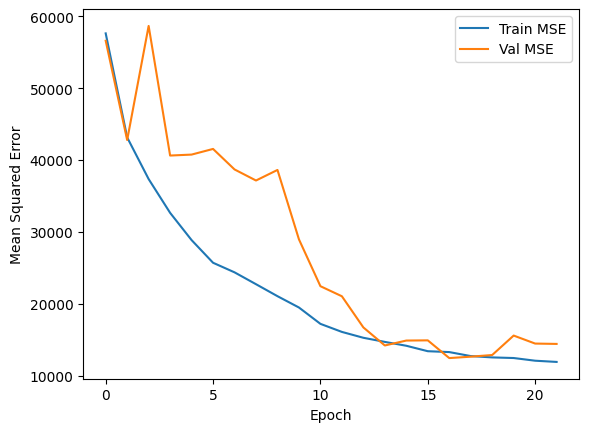

In [109]:
# Define custom RMSE metric (though not used for loss, needed for previous plots, keeping for now)
def rmse_metric(y_true, y_pred):
    return K.sqrt(K.mean(K.square(K.cast(y_true, dtype='float32') - y_pred)))

model = Sequential([
    keras.layers.Dense(256, activation='relu'),
    Dropout(0.2),
    keras.layers.Dense(128, activation='relu'),
    Dropout(0.2),
    keras.layers.Dense(64, activation='relu'),
    Dropout(0.1),
    keras.layers.Dense(1, activation='relu')#,
   # Dropout(0.1),
   # keras.layers.Dense(1)
])

#%%
model.compile(
    loss=tf.keras.losses.Huber(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),       # explicit LR so scheduler can adjust it
    metrics=['mse']
)

early_stop = keras.callbacks.EarlyStopping(
    monitor='val_mse',
    mode='min', # MSE should be minimized
    patience=5,
    restore_best_weights=True
    )

lr_scheduler = keras.callbacks.ReduceLROnPlateau(
    monitor='val_mse',      # watches val MSE
    factor=0.5,             # halves the LR when it plateaus
    patience=5,             # waits 5 epochs of no improvement
    min_lr=1e-6,            # won't go below this
    verbose=1               # prints when LR changes
)

history = model.fit(X_train_seq, y_train_seq,
                    epochs=100,
                    validation_data=(X_val_seq, y_val_seq),
                    batch_size=120,
                    callbacks=[early_stop, lr_scheduler],
                    shuffle=False)
# history = model.fit(train_features, train_labels, epochs=2000, verbose=0, validation_split = .2, batch_size=tester2,
#                     callbacks=[early_stop, PrintDot()])

hist = pd.DataFrame(history.history)

hist = hist.reset_index()

def plot_history():
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Squared Error') # Updated label
    plt.plot(hist['index'], hist['mse'], label='Train MSE') # Updated metric name
    plt.plot(hist['index'], hist['val_mse'], label = 'Val MSE') # Updated metric name
    plt.legend()
    # plt.ylim([0,50])

plot_history()

Epoch 1/50
656/656 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 175.9617 - mse: 64769.2773 - val_loss: 154.7243 - val_mse: 58311.3594
Epoch 2/50
656/656 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 114.9364 - mse: 34308.2500 - val_loss: 133.2294 - val_mse: 43805.1172
Epoch 3/50
656/656 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 107.6384 - mse: 30237.6895 - val_loss: 169.0215 - val_mse: 64230.4336
Epoch 4/50
656/656 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 102.5771 - mse: 27838.5312 - val_loss: 140.9927 - val_mse: 49335.8359
Epoch 5/50
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 97.0071 - mse: 25435.2871 - val_loss: 108.8505 - val_mse: 30542.8828
Epoch 6/50
656/656 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 87.6519 - mse: 21378.2422 - val_loss: 135.9678 - val_mse: 46455.6172
Epoch 7/50
656/656 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 84.7485 - mse: 20139.5117 - val_loss: 118.0149 - val_mse: 33775.3320
Epoch 8/50
656/656 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 81.9862 - mse: 18469.9531 - val_l

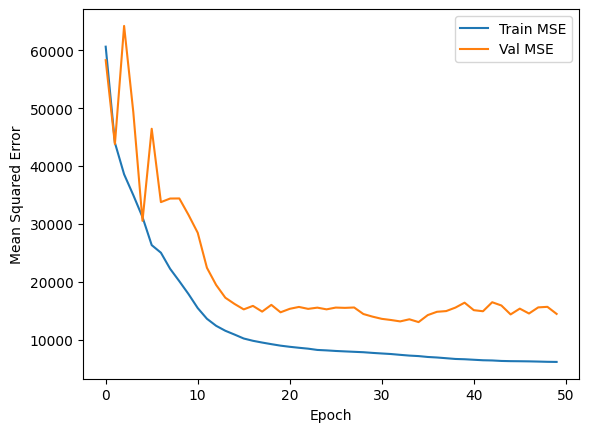

In [113]:
# Define custom RMSE metric (though not used for loss, needed for previous plots, keeping for now)
def rmse_metric(y_true, y_pred):
    return K.sqrt(K.mean(K.square(K.cast(y_true, dtype='float32') - y_pred)))

model = Sequential([
    keras.layers.Dense(256, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(1)
])

#%%
model.compile(
    loss=tf.keras.losses.Huber(),
    optimizer='adam',
    metrics=['mse']
)
early_stop = keras.callbacks.EarlyStopping(
    monitor='val_mse',
    mode='min', # MSE should be minimized
    patience=30,
    restore_best_weights=True
    )

history = model.fit(X_train_seq, y_train_seq,
                    epochs=50,
                    validation_data=(X_val_seq, y_val_seq),
                    batch_size=120,
                    callbacks=[early_stop],
                    shuffle=False)
# history = model.fit(train_features, train_labels, epochs=2000, verbose=0, validation_split = .2, batch_size=tester2,
#                     callbacks=[early_stop, PrintDot()])

hist = pd.DataFrame(history.history)

hist = hist.reset_index()

def plot_history():
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Squared Error') # Updated label
    plt.plot(hist['index'], hist['mse'], label='Train MSE') # Updated metric name
    plt.plot(hist['index'], hist['val_mse'], label = 'Val MSE') # Updated metric name
    plt.legend()
    # plt.ylim([0,50])

plot_history()

In [115]:
predictions = model.predict(X_test_seq)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [116]:

result = root_mean_squared_error(y_test_seq, predictions)
result

133.8201904296875

In [117]:
r2 = r2_score(y_test_seq,predictions)
r2

0.9226186275482178

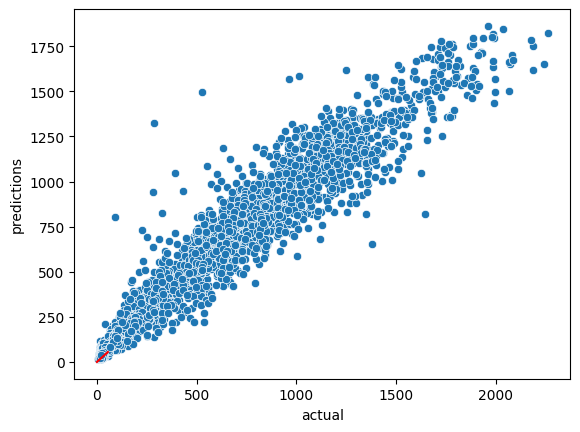

In [118]:
pred = pd.DataFrame(predictions,columns=['predictions'])
pred
pred['actual'] = y_test_seq.tolist()
pred

pred['difference'] = pred['actual']-pred['predictions']
pred

import seaborn as sns
xlims =(0,55)
ax = sns.scatterplot(data=pred,x='actual',y='predictions')
ax.plot(xlims,xlims, color='r')
plt.show()

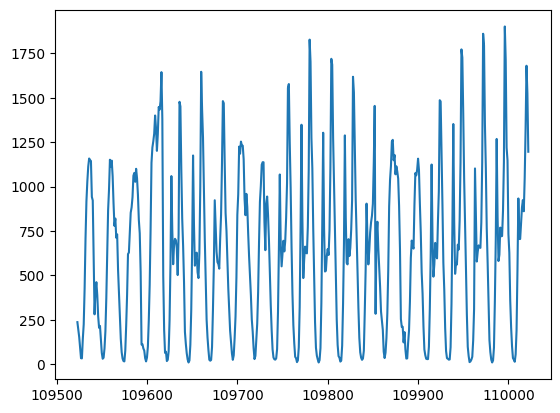

In [119]:
plt.plot(y_test_seq[:500])

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


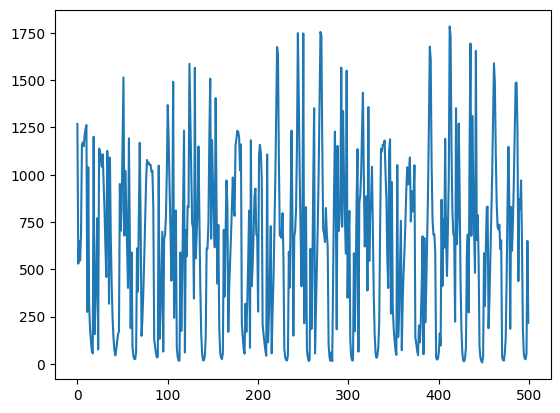

In [ ]:
pred = model.predict(X_test_seq[:500]).flatten()
plt.plot(pred)

## XGBOOST

In [137]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#%%
#Model testing first
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization
from sklearn.metrics import root_mean_squared_error, r2_score
import numpy as np

# Load the dataset
data = pd.read_csv("https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/bikes.csv")


# Display the first few rows of the dataset
data.head()
# %%
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112475 entries, 0 to 112474
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   dteday        112475 non-null  object 
 1   hr            112475 non-null  float64
 2   casual        112475 non-null  int64  
 3   registered    112475 non-null  int64  
 4   temp_c        112475 non-null  float64
 5   feels_like_c  112475 non-null  float64
 6   hum           112475 non-null  float64
 7   windspeed     112475 non-null  float64
 8   weathersit    112475 non-null  int64  
 9   season        112475 non-null  int64  
 10  holiday       112475 non-null  int64  
 11  workingday    112475 non-null  int64  
dtypes: float64(5), int64(6), object(1)
memory usage: 10.3+ MB


In [138]:
events = [

    # =============================
    # PRESIDENTIAL INAUGURATIONS
    # =============================
    {"name": "inauguration_2013", "type": "political",
     "start": "2013-01-20 00:00", "end": "2013-01-21 23:59"},

    {"name": "inauguration_2017", "type": "political",
     "start": "2017-01-19 00:00", "end": "2017-01-21 23:59"},

    {"name": "inauguration_2021", "type": "political",
     "start": "2021-01-19 00:00", "end": "2021-01-21 23:59"},


    # =============================
    # MAJOR POLITICAL PROTESTS
    # =============================
    {"name": "womens_march_2017", "type": "political",
     "start": "2017-01-20 18:00", "end": "2017-01-21 23:59"},

    {"name": "march_for_our_lives_2018", "type": "political",
     "start": "2018-03-23 18:00", "end": "2018-03-24 23:59"},

    {"name": "george_floyd_protests_2020", "type": "political",
     "start": "2020-05-29 18:00", "end": "2020-06-07 23:59"},


    # =============================
    # CYCLING EVENTS (DC Bike Ride)
    # =============================
    {"name": "dc_bike_ride_2016", "type": "cycling",
     "start": "2016-05-14 00:00", "end": "2016-05-15 23:59"},

    {"name": "dc_bike_ride_2017", "type": "cycling",
     "start": "2017-05-13 00:00", "end": "2017-05-14 23:59"},

    {"name": "dc_bike_ride_2018", "type": "cycling",
     "start": "2018-05-19 00:00", "end": "2018-05-20 23:59"},

    {"name": "dc_bike_ride_2019", "type": "cycling",
     "start": "2019-05-18 00:00", "end": "2019-05-19 23:59"},

    {"name": "dc_bike_ride_2022", "type": "cycling",
     "start": "2022-09-09 00:00", "end": "2022-09-11 23:59"},

    {"name": "dc_bike_ride_2023", "type": "cycling",
     "start": "2023-09-08 00:00", "end": "2023-09-10 23:59"},


    # =============================
    # CHERRY BLOSSOM FESTIVAL (Peak weeks)
    # =============================
    {"name": "cherry_blossom_2018", "type": "cultural",
     "start": "2018-04-01 00:00", "end": "2018-04-15 23:59"},

    {"name": "cherry_blossom_2019", "type": "cultural",
     "start": "2019-04-01 00:00", "end": "2019-04-14 23:59"},

    {"name": "cherry_blossom_2022", "type": "cultural",
     "start": "2022-03-20 00:00", "end": "2022-04-17 23:59"},

    {"name": "cherry_blossom_2023", "type": "cultural",
     "start": "2023-03-18 00:00", "end": "2023-04-16 23:59"},
]

fechas_eventos = [
    # DC Bike Ride (Suele ser mayo o septiembre)
    '2016-05-22', '2017-05-14', '2018-05-19', '2019-05-18', '2021-09-25', '2022-09-10', '2023-09-09',
    # Bike to Work Day (Tercer viernes de mayo)
    '2011-05-20', '2012-05-18', '2013-05-17', '2014-05-16', '2015-05-15', '2016-05-20',
    '2017-05-19', '2018-05-18', '2019-05-17', '2020-05-15', '2021-05-21', '2022-05-20', '2023-05-19',
    # WABA 50 States Ride (Septiembre)
    '2021-09-11', '2022-09-10', '2023-09-16',
    # Armed Forces Cycling Classic (Junio)
    '2021-06-05', '2021-06-06', '2022-06-04', '2022-06-05', '2023-06-03', '2023-06-04'
]

event_dates = pd.to_datetime(fechas_eventos).date

In [139]:
def rawtransformer(data):
    data['total'] = data['casual'] + data['registered']


    data["datetime"] = pd.to_datetime(data["dteday"])
    data["month"] = data["datetime"].dt.month
    data['day'] = data['datetime'].dt.day
    data["day_of_week"] = data["datetime"].dt.dayofweek
    data["year"] = data["datetime"].dt.year

    data["hour_sin"] = np.sin(2 * np.pi * data["hr"] / 24)
    data["hour_cos"] = np.cos(2 * np.pi * data["hr"] / 24)
    data["dow_sin"] = np.sin(2 * np.pi * data["day_of_week"] / 7)
    data["dow_cos"] = np.cos(2 * np.pi * data["day_of_week"] / 7)
    data["month_sin"] = np.sin(2 * np.pi * data["month"] / 12)
    data["month_cos"] = np.cos(2 * np.pi * data["month"] / 12)
    data["time_index"] = np.arange(len(data))

    data = data.drop(columns=['hr','day_of_week'])


    data["mean_roll_year_c"] = data["casual"].shift(8760).rolling(5, center = True).mean()
    data["mean_roll_year+5_c"] = data["casual"].shift(8765).rolling(5, center = True).mean()
    data["mean_roll_year+24_c"] = data["casual"].shift(8784).rolling(5, center = True).mean()
    data["mean_roll_year+168_c"] = data["casual"].shift(8928).rolling(5, center = True).mean()

    data["mean_roll_year_r"] = data["registered"].shift(8760).rolling(5, center = True).mean()
    data["mean_roll_5_r"] = data["registered"].shift(8765).rolling(5, center = True).mean()
    data["mean_roll_24_r"] = data["registered"].shift(8784).rolling(5, center = True).mean()
    data["mean_roll_168_r"] = data["registered"].shift(8928).rolling(5, center = True).mean()

    data["median_roll_year_r"] = data["registered"].shift(8760).rolling(5, center = True).median()
    data["median_roll_year+5_r"] = data["registered"].shift(8765).rolling(5, center = True).median()
    data["median_roll_year+24_r"] = data["registered"].shift(8784).rolling(5, center = True).median()
    data["median_roll_year+168_r"] = data["registered"].shift(8928).rolling(5, center = True).median()

    data["median_roll_year_c"] = data["casual"].shift(8760).rolling(5, center = True).median()
    data["median_roll_year+5_c"] = data["casual"].shift(8765).rolling(5, center = True).median()
    data["median_roll_year+24_c"] = data["casual"].shift(8784).rolling(5, center = True).median()
    data["median_roll_year+168_c"] = data["casual"].shift(8928).rolling(5, center = True).median()

    data["std_roll_year_c"] = data["casual"].shift(8760).rolling(5, center = True).std()
    data["std_roll_year+5_c"] = data["casual"].shift(8765).rolling(5, center = True).std()
    data["std_roll_year+24_c"] = data["casual"].shift(8784).rolling(5, center = True).std()
    data["std_roll_year+168_c"] = data["casual"].shift(8928).rolling(5, center = True).std()

    data["std_roll_year_r"] = data["registered"].shift(8760).rolling(5, center = True).std()
    data["std_roll_year+5_r"] = data["registered"].shift(8765).rolling(5, center = True).std()
    data["std_roll_year+24_r"] = data["registered"].shift(8784).rolling(5, center = True).std()
    data["std_roll_year+168_r"] = data["registered"].shift(8928).rolling(5, center = True).std()


    covid_start = pd.Timestamp("2020-03-01 00:00")
    covid_end = pd.Timestamp("2021-10-01 00:00")

    data['pre_covid'] = data['datetime'] < covid_start
    data['covid'] = (data['datetime'] >= covid_start) & (data['datetime'] <= covid_end)
    data['post_covid'] = data['datetime'] > covid_end

    data["time_index"] = np.arange(len(data))
    def apply_events(df, events_list):

      df['event_general'] = False
      df['event_political'] = False
      df['event_cycling'] = False
      df['event_cultural'] = False

      for event in events_list:

          start = pd.Timestamp(event['start'])
          end = pd.Timestamp(event['end'])

          mask = (df['datetime'] >= start) & (df['datetime'] <= end)

          df.loc[mask, 'event_general'] = True

          if event['type'] == "political":
              df.loc[mask, 'event_political'] = True
          elif event['type'] == "cycling":
              df.loc[mask, 'event_cycling'] = True
          elif event['type'] == "cultural":
              df.loc[mask, 'event_cultural'] = True

      return df
    data = apply_events(data, events)
    data['event_cycling'] = data['datetime'].dt.date.isin(event_dates)



    data = data.drop(columns = ["datetime","dteday"])

    return data

data = rawtransformer(data)
# data = data[~data['year'].isin([2020, 2021])]

data = data.dropna()

X_train = data[(data['year'] == 2023) & (data['month']<7)].drop(columns=["casual","registered","total"])
y_train = data[(data['year'] == 2023) & (data['month']<7)]["total"]

X_test = data[(data['year'] == 2023) & (data['month']>=7)].drop(columns=["casual","registered","total"])
y_test = data[(data['year'] == 2023) & (data['month']>=7)]['total']



In [140]:
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBRegressor

model = XGBRegressor()
param_grid = {
    "max_depth": [3, 4, 5],
    "learning_rate": [0.01, 0.05, 0.1, 0.2],
    "n_estimators": [100, 200, 300, 400, 500],
    "subsample": [0.8, 1.0],
}
random = RandomizedSearchCV(
    model,
    param_distributions=param_grid,
    n_iter=20,
    cv=5,
    scoring="r2", # Changed scoring metric to R^2
    random_state=42
)

random.fit(X_train, y_train)
print(random.best_params_)

{'subsample': 1.0, 'n_estimators': 300, 'max_depth': 5, 'learning_rate': 0.05}


In [133]:
from xgboost import XGBRegressor
model = XGBRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=5,
    subsample=0.8,
    )
model.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.05, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=500,
             n_jobs=None, num_parallel_tree=None, ...)

In [136]:
# !pip install lets-plot
from sklearn.metrics import root_mean_squared_error, r2_score
from lets_plot import *
y_preds = model.predict(X_test)
print(f"RMSE: {root_mean_squared_error(y_test,y_preds)}")
print(f'R2: {r2_score(y_test, y_preds)}')

# Get feature importances
feature_importances = model.feature_importances_
feature_names = X_train.columns

# Create a DataFrame for better visualization
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': feature_importances
}).sort_values(by='importance', ascending=False)

# Print feature importances
print(f'Feature Importance')
print(importance_df)

# Plot feature importances
p = ggplot(importance_df, aes(x='feature', y='importance')) + \
    geom_bar(stat='identity', fill='steelblue') + \
    coord_flip() + \
    labs(x='Feature', y='Importance', title='Feature Importances from XGBoost Model')
p.show()

RMSE: 153.2421112060547
R2: 0.8985272645950317
Feature Importance
                   feature  importance
26      median_roll_year_r    0.279352
29  median_roll_year+168_r    0.208742
12                hour_cos    0.093940
11                hour_sin    0.054373
4               weathersit    0.050436
7               workingday    0.036696
22        mean_roll_year_r    0.030985
25         mean_roll_168_r    0.029880
0                   temp_c    0.028777
13                 dow_sin    0.024241
1             feels_like_c    0.013275
2                      hum    0.012550
5                   season    0.012198
33  median_roll_year+168_c    0.011064
17              time_index    0.010038
42           event_general    0.007293
23           mean_roll_5_r    0.006766
14                 dow_cos    0.006500
21    mean_roll_year+168_c    0.005671
41     std_roll_year+168_r    0.005167
30      median_roll_year_c    0.005155
32   median_roll_year+24_c    0.004880
18        mean_roll_year_c    0.00482

In [120]:
original_data = pd.read_csv("https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/bikes.csv")
holdout_mini = pd.read_csv("https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/biking_holdout_test_mini.csv")
original_data["is_holdout"] = 0
holdout_mini["is_holdout"] = 1
holdout_mini.shape

(384, 11)

In [121]:
combined = pd.concat([original_data, holdout_mini], ignore_index=True)
combined["datetime"] = pd.to_datetime(combined["dteday"])
combined_transformed = rawtransformer(combined)

holdout_mini = combined_transformed[
    combined_transformed["is_holdout"] == 1
]
holdout_mini = holdout_mini.drop(columns=["casual","registered","total"])

In [ ]:
combined.tail(50)

,dteday,hr,casual,registered,temp_c,feels_like_c,hum,windspeed,weathersit,season,holiday,workingday,is_holdout,datetime,total
112809,11/28/2023,22.0,NaN,NaN,-1.3,-5.2,0.4091,11.5,1,4,0,1,1,2023-11-28,NaN
112810,11/28/2023,23.0,NaN,NaN,-1.7,-5.3,0.4410,9.7,1,4,0,1,1,2023-11-28,NaN
112811,11/29/2023,0.0,NaN,NaN,-2.2,-6.7,0.4564,13.0,1,4,0,1,1,2023-11-29,NaN
112812,11/29/2023,1.0,NaN,NaN,-2.8,-6.2,0.4789,8.6,1,4,0,1,1,2023-11-29,NaN
112813,11/29/2023,2.0,NaN,NaN,-2.9,-7.5,0.4811,12.7,1,4,0,1,1,2023-11-29,NaN
112814,11/29/2023,3.0,NaN,NaN,-2.9,-7.6,0.4796,13.4,1,4,0,1,1,2023-11-29,NaN
112815,11/29/2023,4.0,NaN,NaN,-3.3,-6.3,0.5041,7.2,1,4,0,1,1,2023-11-29,NaN
112816,11/29/2023,5.0,NaN,NaN,-3.6,-7.2,0.5148,9.0,1,4,0,1,1,2023-11-29,NaN
112817,11/29/2023,6.0,NaN,NaN,-3.7,-6.7,0.5171,7.1,1,4,0,1,1,2023-11-29,NaN
112818,11/29/2023,7.0,NaN,NaN,-3.8,-6.1,0.5188,5.4,1,4,0,1,1,2023-11-29,NaN


In [72]:
holdout_mini.info()

<class 'pandas.core.frame.DataFrame'>
Index: 384 entries, 112475 to 112858
Data columns (total 49 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   temp_c                  384 non-null    float64
 1   feels_like_c            384 non-null    float64
 2   hum                     384 non-null    float64
 3   windspeed               384 non-null    float64
 4   weathersit              384 non-null    int64  
 5   season                  384 non-null    int64  
 6   holiday                 384 non-null    int64  
 7   workingday              384 non-null    int64  
 8   month                   384 non-null    int32  
 9   day                     384 non-null    int32  
 10  year                    384 non-null    int32  
 11  hour_sin                384 non-null    float64
 12  hour_cos                384 non-null    float64
 13  dow_sin                 384 non-null    float64
 14  dow_cos                 384 non-null   

In [122]:
holdout_mini = holdout_mini[feature_columns]
holdout_mini.shape

(384, 46)

In [123]:
import pandas as pd

holdout_mini = pd.DataFrame(holdout_mini, columns=feature_columns)
holdout_mini = holdout_mini.ffill()

In [124]:
# holdout_mini = pd.read_csv("https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/biking_holdout_test_mini.csv")

# holdout_mini = rawtransformer(holdout_mini)

holdout_mini = scaler.transform(holdout_mini)

holdout_mini_pred = np.round(model.predict(holdout_mini).flatten(),0).astype(int)

holdout_mini_pred = pd.DataFrame(holdout_mini_pred, columns=["predictions"])

holdout_mini_pred.to_csv("team4_molude4.csv", index=False)



12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


In [74]:
holdout_mini_pred.shape

(384, 1)

In [125]:
print(np.max(holdout_mini_pred))
print(np.min(holdout_mini_pred))
print(np.mean(holdout_mini_pred))

1334
9
381.9895833333333


In [ ]:
print("Max real:", np.max(y_test_seq))
print("Min real:", np.min(y_test_seq))
print("Mean real:", np.mean(y_test_seq))

Max real: 2262
Min real: 6
Mean real: 636.3003389830509


In [ ]:
print(type(y_test_seq))
print(type(predictions))
print(y_test_seq.shape)
print(holdout_mini_pred.shape)

<class 'pandas.core.series.Series'>
<class 'numpy.ndarray'>
(2950,)
(384, 1)


In [ ]:
print(np.var(y_test_seq))

231433.9809829367


# FINDINGS



*  Weather situation is very important. While registered users are less sensitive to the weather sitaution, it requires to be very low to reach the same situation than casual. Casual's frequency decreases a lot when it is below 10°C, while registered frequency decreases when it is below -8
*   There is a seasonality pattern: in winter is the lowest, and goes up until fall that at its end decreases.
* There is a relationship on important events happening on the city (political, riding, bicycles)
* SPONSOR RIDERS EVENTS!!! TRACK THEM AND DO CAMPAIGNS FOR THEM

* On weekend/holidays place the bikes on stategic places (nearby tourism or recreational locations)

*



# Task
The user has approved. I will now apply event flags to the `bikes` DataFrame.

This will involve:
1. Defining a function `apply_event_flags` that iterates through the provided `events` list.
2. For each event, it will convert the 'start' and 'end' times to pandas datetime objects.
3. For each event, it will create boolean masks to identify rows in the `bikes` DataFrame where 'datetime' falls within the event's start and end times.
4. It will then set the `event_general` flag to `True` for all matching rows.
5. Additionally, it will set specific event type flags (`event_political`, `event_cycling`, `event_cultural`) to `True` for matching rows based on the event's 'type'.
6. Finally, this function will be applied to the `bikes` DataFrame to create the new event flag columns.
7. Display the first few rows of the DataFrame with the new event flags to verify the changes.

## Apply Event Flags

### Subtask:
Define a function to apply event flags (political, cycling, cultural, and general event) to the `bikes` DataFrame based on the provided `events` list and then apply this function to the DataFrame.


**Reasoning**:
First, I'll convert the 'dteday' column to datetime objects and create a 'total' column by summing 'casual' and 'registered' if they don't already exist. These are crucial preprocessing steps that will be used in the `apply_event_flags` function. After these initial data preparations, I will define the `apply_event_flags` function to add event flags (general, political, cycling, cultural) to the DataFrame based on the provided `events` list.



In [54]:
bikes['total'] = bikes['casual'] + bikes['registered']
bikes['datetime'] = pd.to_datetime(bikes['dteday'])

def apply_event_flags(df, events_list):
    df['event_general'] = False
    df['event_political'] = False
    df['event_cycling'] = False
    df['event_cultural'] = False

    for event in events_list:
        start = pd.Timestamp(event['start'])
        end = pd.Timestamp(event['end'])

        mask = (df['datetime'] >= start) & (df['datetime'] <= end)

        df.loc[mask, 'event_general'] = True

        if event['type'] == 'political':
            df.loc[mask, 'event_political'] = True
        elif event['type'] == 'cycling':
            df.loc[mask, 'event_cycling'] = True
        elif event['type'] == 'cultural':
            df.loc[mask, 'event_cultural'] = True

    return df

bikes = apply_event_flags(bikes, events)
bikes.head()

,dteday,hr,casual,registered,temp_c,feels_like_c,hum,windspeed,weathersit,season,holiday,workingday,total,datetime,event_general,event_political,event_cycling,event_cultural
0,1/1/2011,0.0,3,13,3.0,3.0,0.7957,0.8,1,1,0,0,16,2011-01-01,False,False,False,False
1,1/1/2011,1.0,8,30,1.7,1.7,0.8272,0.8,1,1,0,0,38,2011-01-01,False,False,False,False
2,1/1/2011,2.0,5,26,1.9,1.9,0.8157,1.1,1,1,0,0,31,2011-01-01,False,False,False,False
3,1/1/2011,3.0,3,9,2.5,2.5,0.7831,0.8,1,1,0,0,12,2011-01-01,False,False,False,False
4,1/1/2011,4.0,0,1,2.0,2.0,0.8075,1.1,1,1,0,0,1,2011-01-01,False,False,False,False


**Reasoning**:
The 'bikes' DataFrame was not defined in the current execution context, causing a NameError. I will first load the 'bikes' DataFrame from the provided URL, then proceed with the preprocessing and function application steps as previously intended.



In [51]:
import pandas as pd
import numpy as np

bikes = pd.read_csv("https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/bikes.csv")

bikes['total'] = bikes['casual'] + bikes['registered']
bikes['datetime'] = pd.to_datetime(bikes['dteday'])

def apply_event_flags(df, events_list):
    df['event_general'] = False
    df['event_political'] = False
    df['event_cycling'] = False
    df['event_cultural'] = False

    for event in events_list:
        start = pd.Timestamp(event['start'])
        end = pd.Timestamp(event['end'])

        mask = (df['datetime'] >= start) & (df['datetime'] <= end)

        df.loc[mask, 'event_general'] = True

        if event['type'] == 'political':
            df.loc[mask, 'event_political'] = True
        elif event['type'] == 'cycling':
            df.loc[mask, 'event_cycling'] = True
        elif event['type'] == 'cultural':
            df.loc[mask, 'event_cultural'] = True

    return df

bikes = apply_event_flags(bikes, events)
bikes.head()

,dteday,hr,casual,registered,temp_c,feels_like_c,hum,windspeed,weathersit,season,holiday,workingday,total,datetime,event_general,event_political,event_cycling,event_cultural
0,1/1/2011,0.0,3,13,3.0,3.0,0.7957,0.8,1,1,0,0,16,2011-01-01,False,False,False,False
1,1/1/2011,1.0,8,30,1.7,1.7,0.8272,0.8,1,1,0,0,38,2011-01-01,False,False,False,False
2,1/1/2011,2.0,5,26,1.9,1.9,0.8157,1.1,1,1,0,0,31,2011-01-01,False,False,False,False
3,1/1/2011,3.0,3,9,2.5,2.5,0.7831,0.8,1,1,0,0,12,2011-01-01,False,False,False,False
4,1/1/2011,4.0,0,1,2.0,2.0,0.8075,1.1,1,1,0,0,1,2011-01-01,False,False,False,False


## Calculate Average Rentals for Events

### Subtask:
Calculate the average total bike rentals for each event type and for non-event days.


**Reasoning**:
To calculate the average total bike rentals for each event type and for non-event days, I need to first calculate the mean of the 'total' column for each event type flag and for when 'event_general' is false. Then I will combine these into a single DataFrame.



In [55]:
event_avg_rentals = pd.DataFrame({
    'event_type': [
        'political',
        'cycling',
        'cultural',
        'general',
        'non_event_general'
    ],
    'average_rentals': [
        bikes[bikes['event_political'] == True]['total'].mean(),
        bikes[bikes['event_cycling'] == True]['total'].mean(),
        bikes[bikes['event_cultural'] == True]['total'].mean(),
        bikes[bikes['event_general'] == True]['total'].mean(),
        bikes[bikes['event_general'] == False]['total'].mean()
    ]
})

display(event_avg_rentals)

,event_type,average_rentals
0,political,283.756944
1,cycling,488.842262
2,cultural,464.727746
3,general,440.395486
4,non_event_general,336.980218


## Visualize Event Impact

### Subtask:
Create a bar plot using `lets_plot` to visualize the average bike rentals for different event types and non-event days to show the relationship.


## Summary:

### Q&A
The analysis reveals how different event types and non-event days impact average bike rentals.

### Data Analysis Key Findings
*   The `bikes` DataFrame was successfully augmented with event flags (`event_general`, `event_political`, `event_cycling`, `event_cultural`) indicating whether a specific day falls within an event period and what type of event it is.
*   **Cycling events** recorded the highest average total bike rentals at approximately 488.84.
*   **Cultural events** also showed a strong positive correlation with bike rentals, averaging around 464.73.
*   **General events** (any event type) had an average of approximately 440.40 rentals, which is higher than non-event days.
*   **Non-event days** averaged significantly fewer rentals, at approximately 336.98.
*   **Political events** were associated with the lowest average rentals among all categories, at approximately 283.76, even lower than non-event days.

### Insights or Next Steps
*   Events, particularly cycling and cultural, appear to be strong drivers for increased bike rentals, suggesting potential for promotional activities or increased bike availability during these times.
*   Further investigation could explore the specific characteristics or timing of political events that might lead to a decrease in average bike rentals, as they are the only event type showing a negative correlation compared to non-event days.
